# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

/Users/dtaniguchi/anaconda/lib/python3.5/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
!mkdir data

mkdir: data: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

SVHN Training Set: 182MB [01:02, 2.93MB/s]                              
SVHN Testing Set: 64.3MB [00:45, 1.42MB/s]                            


These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

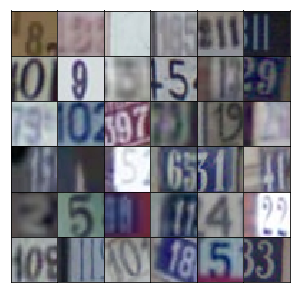

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [17]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z,4*4*512)# In the image above, this layer had size 4x4x1024, but our final layer is half the size of that in the image (ours is 32 but illustration is 32).  So all of our depths will be half of what are shown inimage above
        #Reshaping to be 4x4x512
        x1 = tf.reshape(x1,(-1,4,4,512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(x1, x1*alpha)#leaky relu
        
        # Convolutional layers
        # First conv. layer 
        x2 = tf.layers.conv2d_transpose(x1, filters = 256, kernel_size = 3, strides = 2, padding = 'same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(x2, x2*alpha)# size of 8x8x256
        
        x3 = tf.layers.conv2d_transpose(x2, filters = 128, kernel_size = 3, strides = 2, padding = 'same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(x3, x3*alpha)#size of 16x16x128
        
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(x3, filters = output_dim, kernel_size = 3, strides = 2, padding = 'same')#now size of 32x32x output_dim (where output_dim = 3)
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, or 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [18]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        
        # Below, as add new conv layer, increase depth by 2 and decrease width and height by 2 
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x,filters = 64, kernel_size = 3, strides = 2, padding = 'same')# 16x16x64
        r1 = tf.maximum(x1, x1*alpha)# no need for batch norm on first layer because it introduces weird artifcats
        
        x2 = tf.layers.conv2d(r1, filters = 128, kernel_size=2, strides = 2, padding = 'same')# tensor is size 8x8x128
        b2 = tf.layers.batch_normalization(x2, training=True)
        r2 = tf.maximum(b2, b2*alpha)
        
        x3 = tf.layers.conv2d(r2, filters = 256, kernel_size = 2, strides = 2, padding = 'same')# 4x4x256
        b3 = tf.layers.batch_normalization(x3, training=True)
        r3 = tf.maximum(b3, b3*alpha)
        
        # Flatten
        flat = tf.reshape(r3,(-1, 4*4*256))
        
        logits = tf.layers.dense(flat, units = 1)# no batch norm on last layer.  Only one output (hence units = 1), which send to sigmoid function
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [19]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [20]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined above to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [21]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [22]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [23]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [28]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 25
alpha = 0.2 #for leaky relu
beta1 = 0.5# for Adam optimizers

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 4.2632... Generator Loss: 0.0348
Epoch 1/25... Discriminator Loss: 4.1487... Generator Loss: 0.0414
Epoch 1/25... Discriminator Loss: 3.9725... Generator Loss: 0.0472
Epoch 1/25... Discriminator Loss: 3.4864... Generator Loss: 0.0854
Epoch 1/25... Discriminator Loss: 3.3648... Generator Loss: 0.1199
Epoch 1/25... Discriminator Loss: 2.5643... Generator Loss: 0.2054
Epoch 1/25... Discriminator Loss: 2.4670... Generator Loss: 0.2322
Epoch 1/25... Discriminator Loss: 2.2053... Generator Loss: 0.3956
Epoch 1/25... Discriminator Loss: 1.6014... Generator Loss: 0.4964
Epoch 1/25... Discriminator Loss: 1.7245... Generator Loss: 0.5453


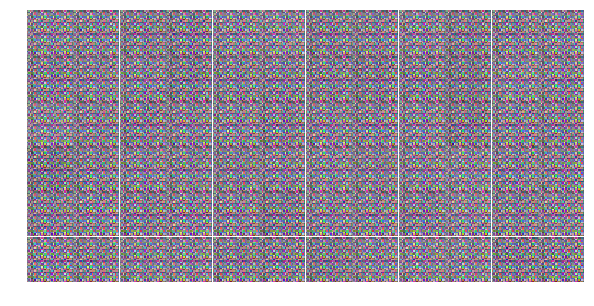

Epoch 1/25... Discriminator Loss: 0.7626... Generator Loss: 1.0170
Epoch 1/25... Discriminator Loss: 0.8177... Generator Loss: 1.0096
Epoch 1/25... Discriminator Loss: 0.7341... Generator Loss: 1.0718
Epoch 1/25... Discriminator Loss: 0.9188... Generator Loss: 1.1252
Epoch 1/25... Discriminator Loss: 0.9719... Generator Loss: 1.4209
Epoch 1/25... Discriminator Loss: 0.6684... Generator Loss: 1.2627
Epoch 1/25... Discriminator Loss: 0.5286... Generator Loss: 1.4464
Epoch 1/25... Discriminator Loss: 0.4505... Generator Loss: 1.5978
Epoch 1/25... Discriminator Loss: 0.4263... Generator Loss: 1.7758
Epoch 1/25... Discriminator Loss: 0.3310... Generator Loss: 1.5546


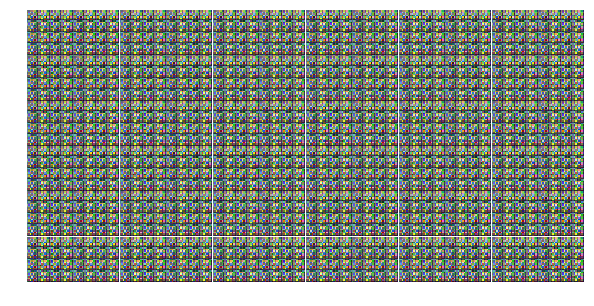

Epoch 1/25... Discriminator Loss: 0.3681... Generator Loss: 1.7272
Epoch 1/25... Discriminator Loss: 0.4448... Generator Loss: 1.6712
Epoch 1/25... Discriminator Loss: 0.5766... Generator Loss: 1.6486
Epoch 1/25... Discriminator Loss: 0.2936... Generator Loss: 1.7095
Epoch 1/25... Discriminator Loss: 0.4070... Generator Loss: 1.8053
Epoch 1/25... Discriminator Loss: 0.4366... Generator Loss: 1.7677
Epoch 1/25... Discriminator Loss: 0.1864... Generator Loss: 2.2893
Epoch 1/25... Discriminator Loss: 0.2038... Generator Loss: 2.0141
Epoch 1/25... Discriminator Loss: 0.3350... Generator Loss: 1.9220
Epoch 1/25... Discriminator Loss: 0.2609... Generator Loss: 1.9539


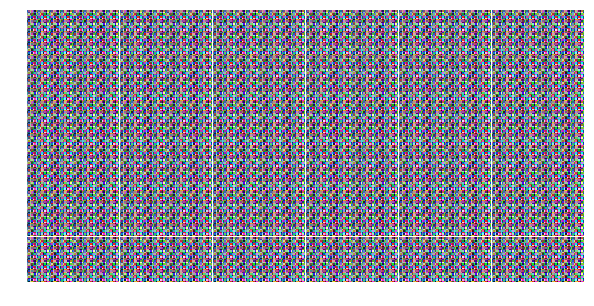

Epoch 1/25... Discriminator Loss: 0.2183... Generator Loss: 2.2525
Epoch 1/25... Discriminator Loss: 0.1756... Generator Loss: 2.2770
Epoch 1/25... Discriminator Loss: 0.2038... Generator Loss: 2.3759
Epoch 1/25... Discriminator Loss: 0.3329... Generator Loss: 2.3324
Epoch 1/25... Discriminator Loss: 0.2547... Generator Loss: 2.4871
Epoch 1/25... Discriminator Loss: 0.1908... Generator Loss: 2.5039
Epoch 1/25... Discriminator Loss: 0.2018... Generator Loss: 2.0204
Epoch 1/25... Discriminator Loss: 0.3203... Generator Loss: 2.4559
Epoch 1/25... Discriminator Loss: 0.1538... Generator Loss: 2.8511
Epoch 1/25... Discriminator Loss: 0.1687... Generator Loss: 2.4131


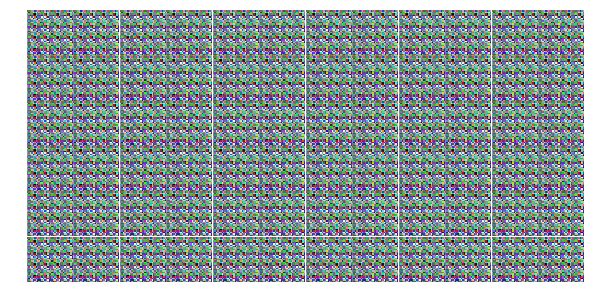

Epoch 1/25... Discriminator Loss: 0.1221... Generator Loss: 2.7198
Epoch 1/25... Discriminator Loss: 0.1314... Generator Loss: 2.5613
Epoch 1/25... Discriminator Loss: 0.1441... Generator Loss: 2.4672
Epoch 1/25... Discriminator Loss: 0.1474... Generator Loss: 2.5745
Epoch 1/25... Discriminator Loss: 0.1590... Generator Loss: 2.1079
Epoch 1/25... Discriminator Loss: 0.1143... Generator Loss: 2.7680
Epoch 1/25... Discriminator Loss: 0.0966... Generator Loss: 2.9600
Epoch 1/25... Discriminator Loss: 0.0964... Generator Loss: 2.7200
Epoch 1/25... Discriminator Loss: 0.1528... Generator Loss: 2.5155
Epoch 1/25... Discriminator Loss: 0.1434... Generator Loss: 2.6287


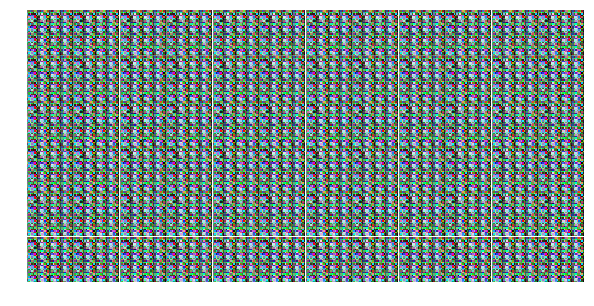

Epoch 1/25... Discriminator Loss: 0.1142... Generator Loss: 2.9569
Epoch 1/25... Discriminator Loss: 0.1579... Generator Loss: 2.3043
Epoch 1/25... Discriminator Loss: 0.0773... Generator Loss: 3.6510
Epoch 1/25... Discriminator Loss: 0.1035... Generator Loss: 3.0962
Epoch 1/25... Discriminator Loss: 0.1138... Generator Loss: 2.6893
Epoch 1/25... Discriminator Loss: 0.1111... Generator Loss: 2.8473
Epoch 1/25... Discriminator Loss: 0.0810... Generator Loss: 2.8036
Epoch 2/25... Discriminator Loss: 0.1018... Generator Loss: 2.6969
Epoch 2/25... Discriminator Loss: 0.1544... Generator Loss: 2.7504
Epoch 2/25... Discriminator Loss: 0.1104... Generator Loss: 2.7823


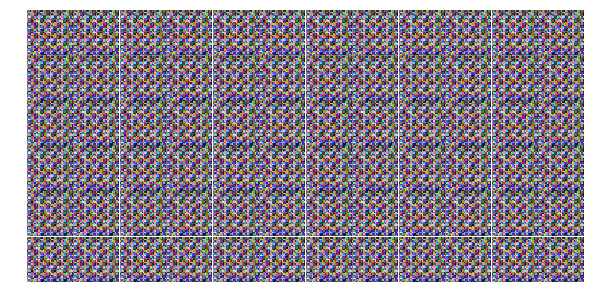

Epoch 2/25... Discriminator Loss: 0.0781... Generator Loss: 2.9550
Epoch 2/25... Discriminator Loss: 0.1127... Generator Loss: 3.1745
Epoch 2/25... Discriminator Loss: 0.0787... Generator Loss: 3.0309
Epoch 2/25... Discriminator Loss: 0.1156... Generator Loss: 2.7208
Epoch 2/25... Discriminator Loss: 0.0604... Generator Loss: 3.2800
Epoch 2/25... Discriminator Loss: 0.0929... Generator Loss: 2.9854
Epoch 2/25... Discriminator Loss: 0.1054... Generator Loss: 2.6801
Epoch 2/25... Discriminator Loss: 0.0644... Generator Loss: 3.4523
Epoch 2/25... Discriminator Loss: 0.0894... Generator Loss: 2.9141
Epoch 2/25... Discriminator Loss: 0.0450... Generator Loss: 3.4470


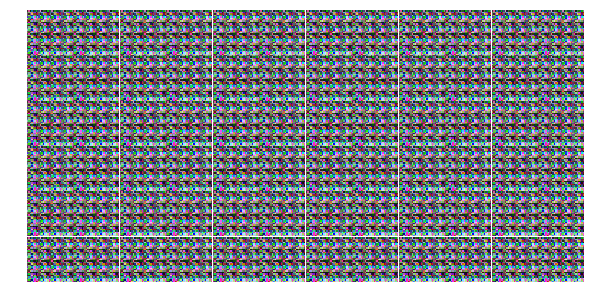

Epoch 2/25... Discriminator Loss: 0.0613... Generator Loss: 3.1485
Epoch 2/25... Discriminator Loss: 0.0999... Generator Loss: 2.9364
Epoch 2/25... Discriminator Loss: 0.0723... Generator Loss: 3.2718
Epoch 2/25... Discriminator Loss: 0.0546... Generator Loss: 3.4642
Epoch 2/25... Discriminator Loss: 0.0661... Generator Loss: 3.6594
Epoch 2/25... Discriminator Loss: 0.0733... Generator Loss: 3.5473
Epoch 2/25... Discriminator Loss: 0.0550... Generator Loss: 3.2866
Epoch 2/25... Discriminator Loss: 0.0508... Generator Loss: 3.6701
Epoch 2/25... Discriminator Loss: 0.0667... Generator Loss: 3.2189
Epoch 2/25... Discriminator Loss: 0.0705... Generator Loss: 2.9416


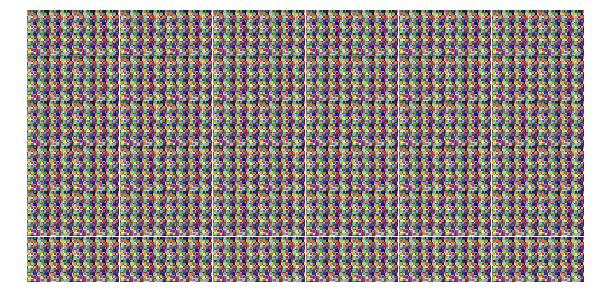

Epoch 2/25... Discriminator Loss: 0.0636... Generator Loss: 3.3197
Epoch 2/25... Discriminator Loss: 0.0686... Generator Loss: 3.3856
Epoch 2/25... Discriminator Loss: 0.1012... Generator Loss: 4.0231
Epoch 2/25... Discriminator Loss: 0.0410... Generator Loss: 3.6574
Epoch 2/25... Discriminator Loss: 0.0688... Generator Loss: 3.5679
Epoch 2/25... Discriminator Loss: 0.1172... Generator Loss: 3.3431
Epoch 2/25... Discriminator Loss: 0.0459... Generator Loss: 3.7134
Epoch 2/25... Discriminator Loss: 0.0362... Generator Loss: 3.8372
Epoch 2/25... Discriminator Loss: 0.0409... Generator Loss: 3.7706
Epoch 2/25... Discriminator Loss: 0.0496... Generator Loss: 3.8382


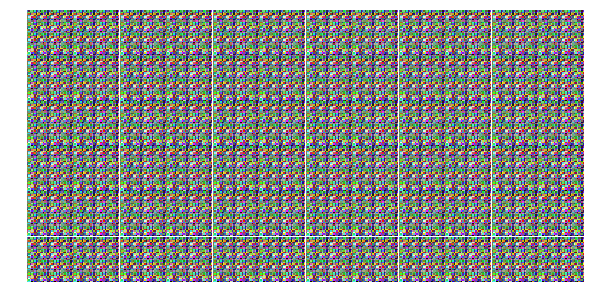

Epoch 2/25... Discriminator Loss: 0.0296... Generator Loss: 3.7529
Epoch 2/25... Discriminator Loss: 0.0411... Generator Loss: 3.6638
Epoch 2/25... Discriminator Loss: 0.0515... Generator Loss: 3.8167
Epoch 2/25... Discriminator Loss: 0.0595... Generator Loss: 3.6596
Epoch 2/25... Discriminator Loss: 0.0479... Generator Loss: 3.7489
Epoch 2/25... Discriminator Loss: 0.0396... Generator Loss: 4.0730
Epoch 2/25... Discriminator Loss: 0.0594... Generator Loss: 3.6615
Epoch 2/25... Discriminator Loss: 0.0742... Generator Loss: 3.3345
Epoch 2/25... Discriminator Loss: 0.0467... Generator Loss: 4.1216
Epoch 2/25... Discriminator Loss: 0.0655... Generator Loss: 3.7673


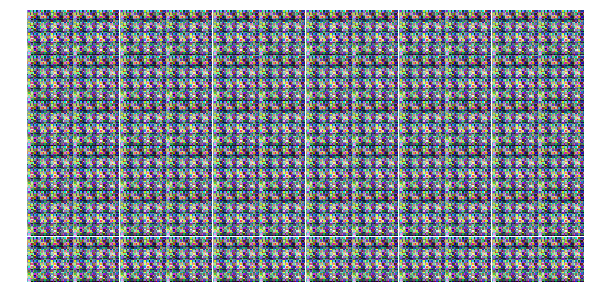

Epoch 2/25... Discriminator Loss: 0.0409... Generator Loss: 3.8396
Epoch 2/25... Discriminator Loss: 0.0959... Generator Loss: 3.1217
Epoch 2/25... Discriminator Loss: 0.0580... Generator Loss: 3.6052
Epoch 2/25... Discriminator Loss: 0.0540... Generator Loss: 3.9777
Epoch 2/25... Discriminator Loss: 0.0340... Generator Loss: 3.7209
Epoch 2/25... Discriminator Loss: 0.0295... Generator Loss: 3.7865
Epoch 2/25... Discriminator Loss: 0.0239... Generator Loss: 4.2103
Epoch 2/25... Discriminator Loss: 0.0324... Generator Loss: 4.0648
Epoch 2/25... Discriminator Loss: 0.0360... Generator Loss: 3.7806
Epoch 2/25... Discriminator Loss: 0.0745... Generator Loss: 3.7231


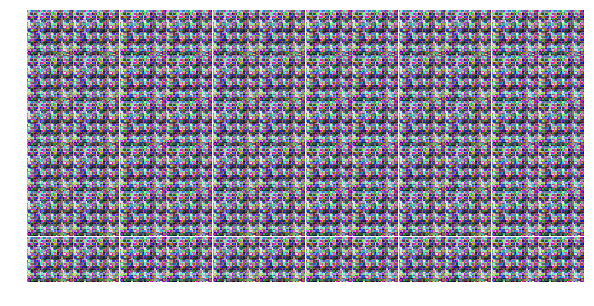

Epoch 2/25... Discriminator Loss: 0.0328... Generator Loss: 3.7754
Epoch 2/25... Discriminator Loss: 0.0456... Generator Loss: 3.9686
Epoch 2/25... Discriminator Loss: 0.0369... Generator Loss: 3.8526
Epoch 2/25... Discriminator Loss: 0.0384... Generator Loss: 4.1816
Epoch 3/25... Discriminator Loss: 0.0535... Generator Loss: 3.9530
Epoch 3/25... Discriminator Loss: 0.0297... Generator Loss: 4.1932
Epoch 3/25... Discriminator Loss: 0.0342... Generator Loss: 3.9043
Epoch 3/25... Discriminator Loss: 0.0347... Generator Loss: 3.9021
Epoch 3/25... Discriminator Loss: 0.0367... Generator Loss: 4.0562
Epoch 3/25... Discriminator Loss: 0.0220... Generator Loss: 4.2496


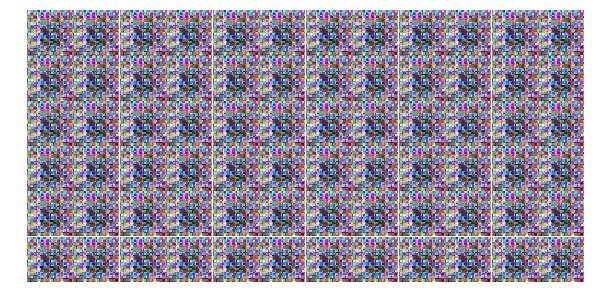

Epoch 3/25... Discriminator Loss: 0.0198... Generator Loss: 4.1498
Epoch 3/25... Discriminator Loss: 0.0364... Generator Loss: 3.7714
Epoch 3/25... Discriminator Loss: 0.0298... Generator Loss: 4.0237
Epoch 3/25... Discriminator Loss: 0.0655... Generator Loss: 3.4736
Epoch 3/25... Discriminator Loss: 0.0225... Generator Loss: 4.2925
Epoch 3/25... Discriminator Loss: 0.0673... Generator Loss: 3.2894
Epoch 3/25... Discriminator Loss: 0.1155... Generator Loss: 2.6700
Epoch 3/25... Discriminator Loss: 0.0651... Generator Loss: 4.3922
Epoch 3/25... Discriminator Loss: 0.1715... Generator Loss: 2.3909
Epoch 3/25... Discriminator Loss: 0.0760... Generator Loss: 5.1105


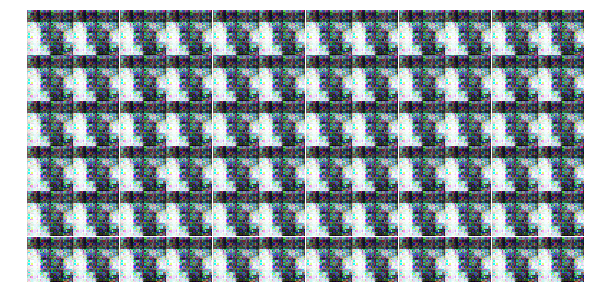

Epoch 3/25... Discriminator Loss: 0.1310... Generator Loss: 3.2084
Epoch 3/25... Discriminator Loss: 0.0755... Generator Loss: 3.6981
Epoch 3/25... Discriminator Loss: 0.0615... Generator Loss: 3.8278
Epoch 3/25... Discriminator Loss: 0.0853... Generator Loss: 3.5136
Epoch 3/25... Discriminator Loss: 0.0855... Generator Loss: 3.7712
Epoch 3/25... Discriminator Loss: 0.1624... Generator Loss: 3.1186
Epoch 3/25... Discriminator Loss: 0.1918... Generator Loss: 2.6448
Epoch 3/25... Discriminator Loss: 0.0593... Generator Loss: 3.6152
Epoch 3/25... Discriminator Loss: 0.0757... Generator Loss: 3.3644
Epoch 3/25... Discriminator Loss: 0.1420... Generator Loss: 3.0739


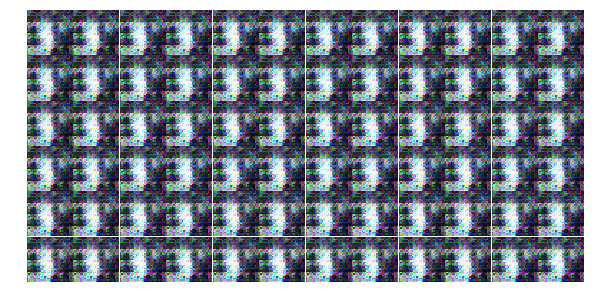

Epoch 3/25... Discriminator Loss: 0.0998... Generator Loss: 3.0902
Epoch 3/25... Discriminator Loss: 0.2049... Generator Loss: 2.9372
Epoch 3/25... Discriminator Loss: 0.1249... Generator Loss: 3.8743
Epoch 3/25... Discriminator Loss: 0.1981... Generator Loss: 3.0983
Epoch 3/25... Discriminator Loss: 0.2574... Generator Loss: 2.4604
Epoch 3/25... Discriminator Loss: 0.1778... Generator Loss: 2.8657
Epoch 3/25... Discriminator Loss: 0.1981... Generator Loss: 3.2564
Epoch 3/25... Discriminator Loss: 0.2318... Generator Loss: 2.7716
Epoch 3/25... Discriminator Loss: 0.3621... Generator Loss: 2.3322
Epoch 3/25... Discriminator Loss: 0.7013... Generator Loss: 2.8828


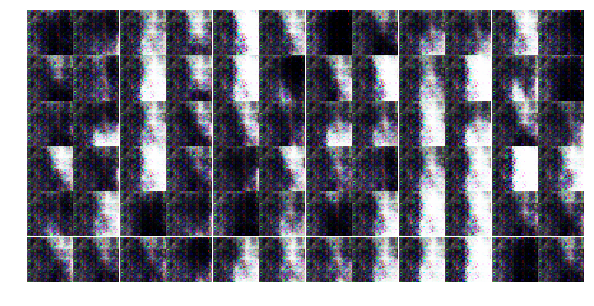

Epoch 3/25... Discriminator Loss: 0.7745... Generator Loss: 2.8493
Epoch 3/25... Discriminator Loss: 1.0212... Generator Loss: 2.2320
Epoch 3/25... Discriminator Loss: 0.6192... Generator Loss: 1.7985
Epoch 3/25... Discriminator Loss: 0.7756... Generator Loss: 1.4144
Epoch 3/25... Discriminator Loss: 0.6857... Generator Loss: 1.2281
Epoch 3/25... Discriminator Loss: 0.4301... Generator Loss: 2.4734
Epoch 3/25... Discriminator Loss: 0.9594... Generator Loss: 2.1756
Epoch 3/25... Discriminator Loss: 0.5479... Generator Loss: 2.2296
Epoch 3/25... Discriminator Loss: 0.7386... Generator Loss: 1.3180
Epoch 3/25... Discriminator Loss: 0.4934... Generator Loss: 1.4961


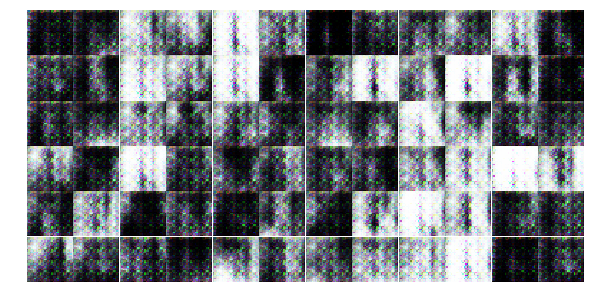

Epoch 3/25... Discriminator Loss: 0.7455... Generator Loss: 1.0560
Epoch 3/25... Discriminator Loss: 0.5426... Generator Loss: 1.6275
Epoch 3/25... Discriminator Loss: 0.7060... Generator Loss: 0.9320
Epoch 3/25... Discriminator Loss: 0.4663... Generator Loss: 2.4301
Epoch 3/25... Discriminator Loss: 1.0897... Generator Loss: 2.8363
Epoch 3/25... Discriminator Loss: 0.4210... Generator Loss: 1.9973
Epoch 3/25... Discriminator Loss: 0.7006... Generator Loss: 0.9511
Epoch 3/25... Discriminator Loss: 0.7563... Generator Loss: 1.7149
Epoch 3/25... Discriminator Loss: 0.8412... Generator Loss: 1.6400
Epoch 3/25... Discriminator Loss: 0.5997... Generator Loss: 1.5752


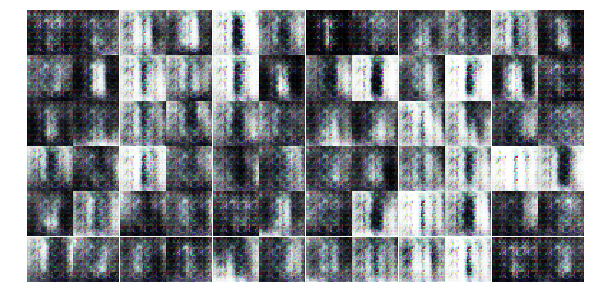

Epoch 3/25... Discriminator Loss: 0.5559... Generator Loss: 1.5664
Epoch 4/25... Discriminator Loss: 0.8225... Generator Loss: 2.3991
Epoch 4/25... Discriminator Loss: 0.6934... Generator Loss: 1.6982
Epoch 4/25... Discriminator Loss: 0.8096... Generator Loss: 1.2010
Epoch 4/25... Discriminator Loss: 1.1447... Generator Loss: 0.5052
Epoch 4/25... Discriminator Loss: 0.8595... Generator Loss: 0.8957
Epoch 4/25... Discriminator Loss: 0.8590... Generator Loss: 1.4456
Epoch 4/25... Discriminator Loss: 0.8707... Generator Loss: 1.4988
Epoch 4/25... Discriminator Loss: 0.9116... Generator Loss: 1.4637
Epoch 4/25... Discriminator Loss: 1.5189... Generator Loss: 0.3796


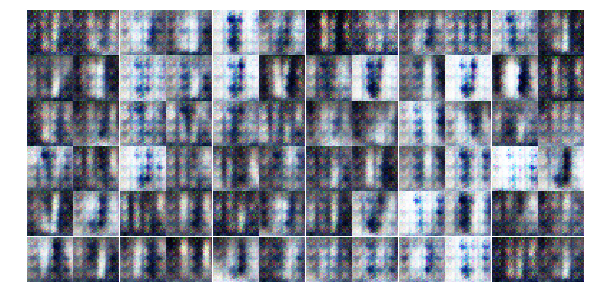

Epoch 4/25... Discriminator Loss: 1.1308... Generator Loss: 0.8044
Epoch 4/25... Discriminator Loss: 1.0081... Generator Loss: 1.5833
Epoch 4/25... Discriminator Loss: 1.0953... Generator Loss: 0.7596
Epoch 4/25... Discriminator Loss: 0.7690... Generator Loss: 1.3638
Epoch 4/25... Discriminator Loss: 1.0026... Generator Loss: 0.9215
Epoch 4/25... Discriminator Loss: 1.1676... Generator Loss: 0.5706
Epoch 4/25... Discriminator Loss: 0.8636... Generator Loss: 1.6366
Epoch 4/25... Discriminator Loss: 1.3053... Generator Loss: 1.0598
Epoch 4/25... Discriminator Loss: 1.1464... Generator Loss: 1.2338
Epoch 4/25... Discriminator Loss: 1.0480... Generator Loss: 1.5679


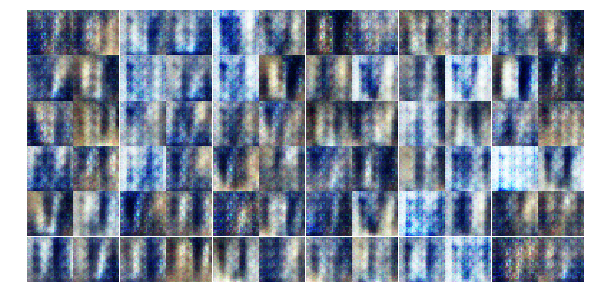

Epoch 4/25... Discriminator Loss: 1.0391... Generator Loss: 0.8774
Epoch 4/25... Discriminator Loss: 0.9930... Generator Loss: 0.9166
Epoch 4/25... Discriminator Loss: 1.2012... Generator Loss: 0.7680
Epoch 4/25... Discriminator Loss: 1.2412... Generator Loss: 0.6734
Epoch 4/25... Discriminator Loss: 0.9957... Generator Loss: 1.0186
Epoch 4/25... Discriminator Loss: 1.1516... Generator Loss: 0.8234
Epoch 4/25... Discriminator Loss: 1.0570... Generator Loss: 0.7533
Epoch 4/25... Discriminator Loss: 1.1008... Generator Loss: 1.3195
Epoch 4/25... Discriminator Loss: 1.1623... Generator Loss: 1.0289
Epoch 4/25... Discriminator Loss: 1.1295... Generator Loss: 0.9703


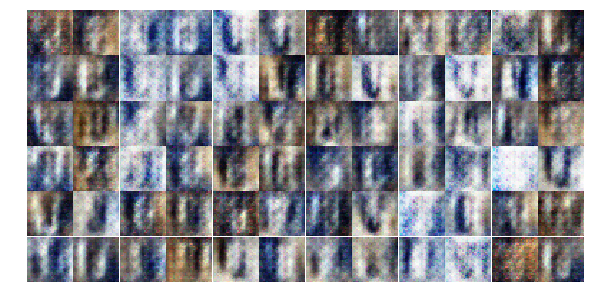

Epoch 4/25... Discriminator Loss: 1.1602... Generator Loss: 1.0793
Epoch 4/25... Discriminator Loss: 1.1252... Generator Loss: 0.8289
Epoch 4/25... Discriminator Loss: 1.4301... Generator Loss: 0.6754
Epoch 4/25... Discriminator Loss: 1.0267... Generator Loss: 1.2894
Epoch 4/25... Discriminator Loss: 1.2989... Generator Loss: 0.7669
Epoch 4/25... Discriminator Loss: 1.0901... Generator Loss: 0.9553
Epoch 4/25... Discriminator Loss: 1.3564... Generator Loss: 0.7247
Epoch 4/25... Discriminator Loss: 1.5135... Generator Loss: 0.5181
Epoch 4/25... Discriminator Loss: 1.2010... Generator Loss: 1.0764
Epoch 4/25... Discriminator Loss: 1.4795... Generator Loss: 0.5148


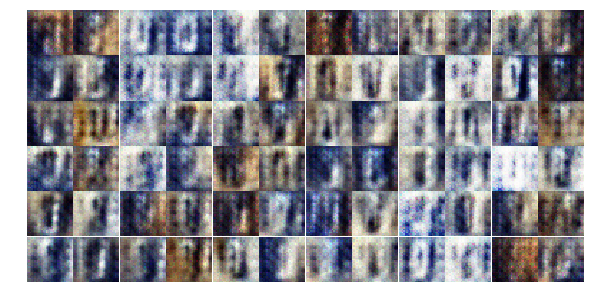

Epoch 4/25... Discriminator Loss: 1.2281... Generator Loss: 0.8729
Epoch 4/25... Discriminator Loss: 1.2850... Generator Loss: 0.8743
Epoch 4/25... Discriminator Loss: 1.3484... Generator Loss: 0.6673
Epoch 4/25... Discriminator Loss: 1.2965... Generator Loss: 0.7707
Epoch 4/25... Discriminator Loss: 1.2217... Generator Loss: 0.9715
Epoch 4/25... Discriminator Loss: 1.2735... Generator Loss: 0.7254
Epoch 4/25... Discriminator Loss: 1.1868... Generator Loss: 0.7699
Epoch 4/25... Discriminator Loss: 1.3108... Generator Loss: 0.8255
Epoch 4/25... Discriminator Loss: 1.0399... Generator Loss: 0.8848
Epoch 4/25... Discriminator Loss: 1.2778... Generator Loss: 0.8120


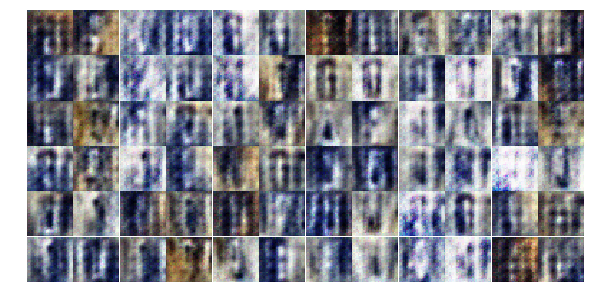

Epoch 4/25... Discriminator Loss: 1.3383... Generator Loss: 0.7775
Epoch 4/25... Discriminator Loss: 1.1959... Generator Loss: 0.8566
Epoch 4/25... Discriminator Loss: 1.2555... Generator Loss: 0.6924
Epoch 4/25... Discriminator Loss: 1.0257... Generator Loss: 0.9779
Epoch 4/25... Discriminator Loss: 1.0706... Generator Loss: 0.8933
Epoch 4/25... Discriminator Loss: 1.0559... Generator Loss: 1.0773
Epoch 4/25... Discriminator Loss: 1.1709... Generator Loss: 0.7694
Epoch 4/25... Discriminator Loss: 1.1635... Generator Loss: 0.9065
Epoch 4/25... Discriminator Loss: 1.1444... Generator Loss: 0.7797
Epoch 5/25... Discriminator Loss: 1.0942... Generator Loss: 0.9606


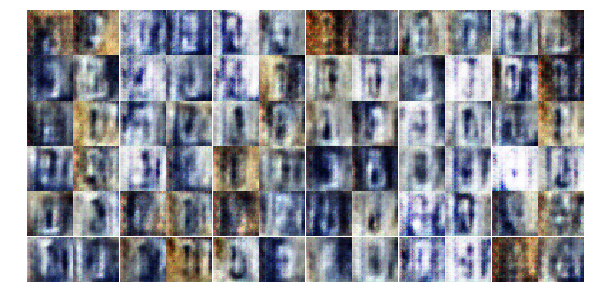

Epoch 5/25... Discriminator Loss: 1.1823... Generator Loss: 0.7533
Epoch 5/25... Discriminator Loss: 0.8994... Generator Loss: 1.3108
Epoch 5/25... Discriminator Loss: 1.1370... Generator Loss: 1.1395
Epoch 5/25... Discriminator Loss: 1.2653... Generator Loss: 0.7586
Epoch 5/25... Discriminator Loss: 1.1901... Generator Loss: 0.9632
Epoch 5/25... Discriminator Loss: 1.1448... Generator Loss: 0.8889
Epoch 5/25... Discriminator Loss: 1.0857... Generator Loss: 0.8749
Epoch 5/25... Discriminator Loss: 1.0700... Generator Loss: 0.8290
Epoch 5/25... Discriminator Loss: 1.2151... Generator Loss: 0.9690
Epoch 5/25... Discriminator Loss: 1.3004... Generator Loss: 0.7703


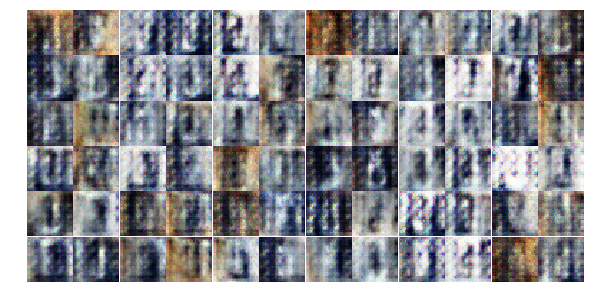

Epoch 5/25... Discriminator Loss: 1.2202... Generator Loss: 0.7269
Epoch 5/25... Discriminator Loss: 1.1994... Generator Loss: 0.8102
Epoch 5/25... Discriminator Loss: 1.1465... Generator Loss: 0.8939
Epoch 5/25... Discriminator Loss: 1.3115... Generator Loss: 0.6299
Epoch 5/25... Discriminator Loss: 1.3102... Generator Loss: 0.7507
Epoch 5/25... Discriminator Loss: 0.9322... Generator Loss: 1.0889
Epoch 5/25... Discriminator Loss: 1.4555... Generator Loss: 0.6519
Epoch 5/25... Discriminator Loss: 1.3099... Generator Loss: 0.8341
Epoch 5/25... Discriminator Loss: 1.2887... Generator Loss: 0.8141
Epoch 5/25... Discriminator Loss: 1.1033... Generator Loss: 1.0201


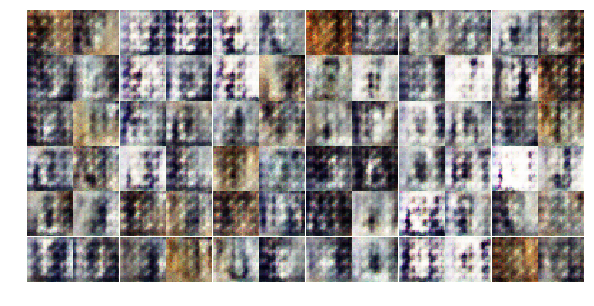

Epoch 5/25... Discriminator Loss: 1.2110... Generator Loss: 0.7506
Epoch 5/25... Discriminator Loss: 1.2117... Generator Loss: 0.8679
Epoch 5/25... Discriminator Loss: 1.3404... Generator Loss: 0.6896
Epoch 5/25... Discriminator Loss: 1.2567... Generator Loss: 0.6325
Epoch 5/25... Discriminator Loss: 1.3923... Generator Loss: 0.5080
Epoch 5/25... Discriminator Loss: 1.1152... Generator Loss: 1.0348
Epoch 5/25... Discriminator Loss: 1.2375... Generator Loss: 0.7508
Epoch 5/25... Discriminator Loss: 1.1114... Generator Loss: 1.2166
Epoch 5/25... Discriminator Loss: 1.3223... Generator Loss: 0.7136
Epoch 5/25... Discriminator Loss: 1.0867... Generator Loss: 0.9772


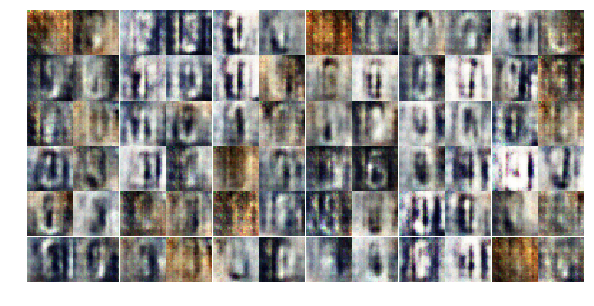

Epoch 5/25... Discriminator Loss: 1.1962... Generator Loss: 0.7668
Epoch 5/25... Discriminator Loss: 1.2147... Generator Loss: 0.7651
Epoch 5/25... Discriminator Loss: 1.4750... Generator Loss: 0.7191
Epoch 5/25... Discriminator Loss: 1.3538... Generator Loss: 0.6096
Epoch 5/25... Discriminator Loss: 1.2665... Generator Loss: 0.6207
Epoch 5/25... Discriminator Loss: 1.1908... Generator Loss: 0.8880
Epoch 5/25... Discriminator Loss: 1.3725... Generator Loss: 0.6255
Epoch 5/25... Discriminator Loss: 1.4192... Generator Loss: 0.5798
Epoch 5/25... Discriminator Loss: 1.2855... Generator Loss: 0.6473
Epoch 5/25... Discriminator Loss: 1.2197... Generator Loss: 0.8851


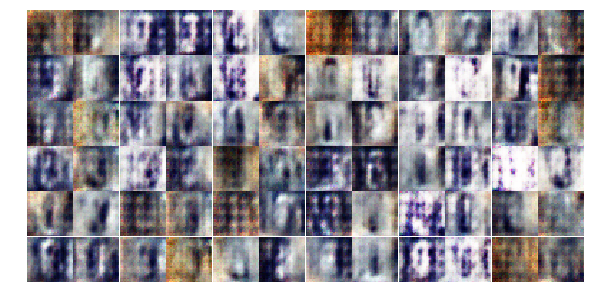

Epoch 5/25... Discriminator Loss: 1.3436... Generator Loss: 0.9774
Epoch 5/25... Discriminator Loss: 1.1985... Generator Loss: 1.0030
Epoch 5/25... Discriminator Loss: 1.5552... Generator Loss: 0.4772
Epoch 5/25... Discriminator Loss: 1.3581... Generator Loss: 0.6332
Epoch 5/25... Discriminator Loss: 1.4766... Generator Loss: 0.9313
Epoch 5/25... Discriminator Loss: 1.4095... Generator Loss: 0.4833
Epoch 5/25... Discriminator Loss: 1.4234... Generator Loss: 0.7635
Epoch 5/25... Discriminator Loss: 1.2993... Generator Loss: 0.8338
Epoch 5/25... Discriminator Loss: 1.1539... Generator Loss: 0.8794
Epoch 5/25... Discriminator Loss: 1.2188... Generator Loss: 0.8708


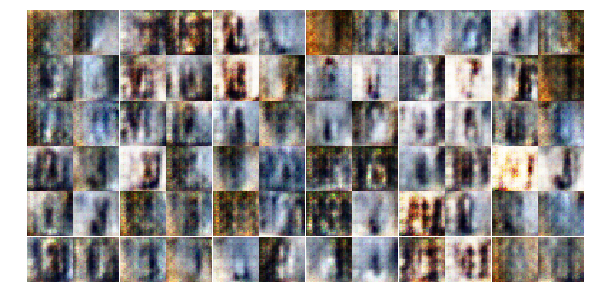

Epoch 5/25... Discriminator Loss: 1.2703... Generator Loss: 0.9613
Epoch 5/25... Discriminator Loss: 1.5366... Generator Loss: 0.6369
Epoch 5/25... Discriminator Loss: 1.5273... Generator Loss: 0.5638
Epoch 5/25... Discriminator Loss: 1.4196... Generator Loss: 0.6548
Epoch 5/25... Discriminator Loss: 1.4077... Generator Loss: 0.7929
Epoch 5/25... Discriminator Loss: 1.6203... Generator Loss: 0.5207
Epoch 6/25... Discriminator Loss: 1.2395... Generator Loss: 0.7460
Epoch 6/25... Discriminator Loss: 1.5671... Generator Loss: 0.6343
Epoch 6/25... Discriminator Loss: 1.0087... Generator Loss: 1.2358
Epoch 6/25... Discriminator Loss: 1.4204... Generator Loss: 0.7247


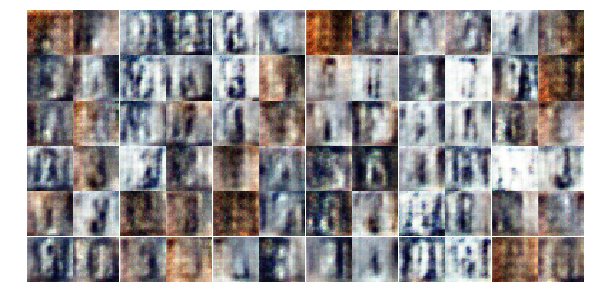

Epoch 6/25... Discriminator Loss: 1.2343... Generator Loss: 0.9343
Epoch 6/25... Discriminator Loss: 1.2199... Generator Loss: 0.8766
Epoch 6/25... Discriminator Loss: 1.3934... Generator Loss: 0.6999
Epoch 6/25... Discriminator Loss: 1.3295... Generator Loss: 1.0071
Epoch 6/25... Discriminator Loss: 1.3041... Generator Loss: 0.7699
Epoch 6/25... Discriminator Loss: 1.3082... Generator Loss: 0.5854
Epoch 6/25... Discriminator Loss: 1.3077... Generator Loss: 0.6916
Epoch 6/25... Discriminator Loss: 1.2659... Generator Loss: 0.7756
Epoch 6/25... Discriminator Loss: 1.3192... Generator Loss: 0.8184
Epoch 6/25... Discriminator Loss: 1.2505... Generator Loss: 0.8498


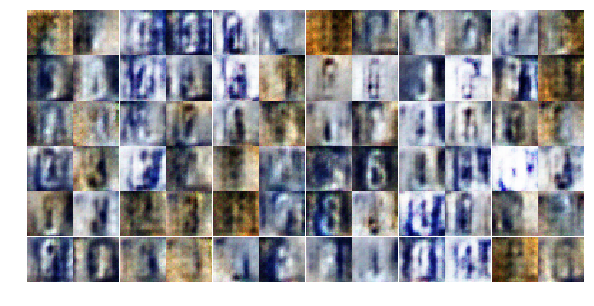

Epoch 6/25... Discriminator Loss: 1.2785... Generator Loss: 0.6117
Epoch 6/25... Discriminator Loss: 1.4586... Generator Loss: 0.5880
Epoch 6/25... Discriminator Loss: 1.0528... Generator Loss: 0.9728
Epoch 6/25... Discriminator Loss: 1.5842... Generator Loss: 0.5849
Epoch 6/25... Discriminator Loss: 1.2754... Generator Loss: 0.7790
Epoch 6/25... Discriminator Loss: 1.2997... Generator Loss: 0.8220
Epoch 6/25... Discriminator Loss: 1.2440... Generator Loss: 0.9280
Epoch 6/25... Discriminator Loss: 1.4925... Generator Loss: 0.6558
Epoch 6/25... Discriminator Loss: 1.3336... Generator Loss: 0.6801
Epoch 6/25... Discriminator Loss: 1.3703... Generator Loss: 0.7412


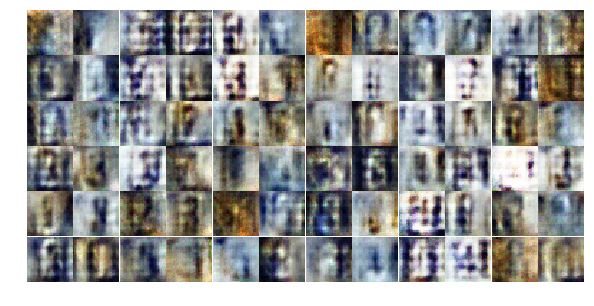

Epoch 6/25... Discriminator Loss: 1.3306... Generator Loss: 0.7597
Epoch 6/25... Discriminator Loss: 1.4542... Generator Loss: 0.5084
Epoch 6/25... Discriminator Loss: 1.3851... Generator Loss: 0.7318
Epoch 6/25... Discriminator Loss: 1.2706... Generator Loss: 0.7861
Epoch 6/25... Discriminator Loss: 1.3794... Generator Loss: 0.7521
Epoch 6/25... Discriminator Loss: 1.2694... Generator Loss: 0.8320
Epoch 6/25... Discriminator Loss: 1.4124... Generator Loss: 0.5778
Epoch 6/25... Discriminator Loss: 1.0443... Generator Loss: 0.9977
Epoch 6/25... Discriminator Loss: 1.2605... Generator Loss: 0.6859
Epoch 6/25... Discriminator Loss: 1.0314... Generator Loss: 1.0395


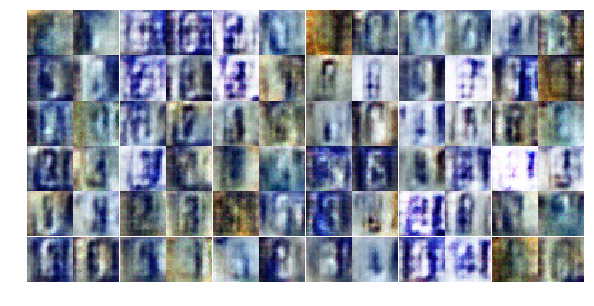

Epoch 6/25... Discriminator Loss: 1.2700... Generator Loss: 0.6883
Epoch 6/25... Discriminator Loss: 1.3830... Generator Loss: 0.8529
Epoch 6/25... Discriminator Loss: 1.1057... Generator Loss: 1.0911
Epoch 6/25... Discriminator Loss: 1.3665... Generator Loss: 0.9599
Epoch 6/25... Discriminator Loss: 1.3444... Generator Loss: 0.6458
Epoch 6/25... Discriminator Loss: 1.3749... Generator Loss: 0.5638
Epoch 6/25... Discriminator Loss: 1.0855... Generator Loss: 0.7698
Epoch 6/25... Discriminator Loss: 1.2017... Generator Loss: 0.9796
Epoch 6/25... Discriminator Loss: 1.3263... Generator Loss: 1.4083
Epoch 6/25... Discriminator Loss: 0.8921... Generator Loss: 1.3566


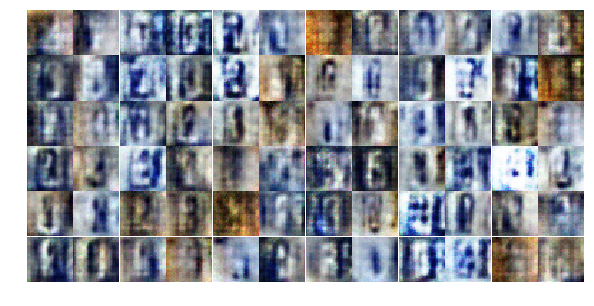

Epoch 6/25... Discriminator Loss: 1.4483... Generator Loss: 0.5430


KeyboardInterrupt: 

In [29]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

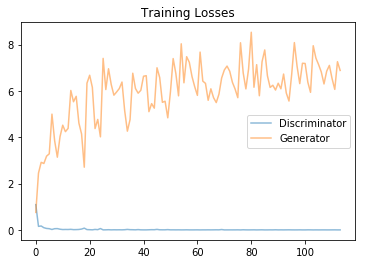

In [30]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

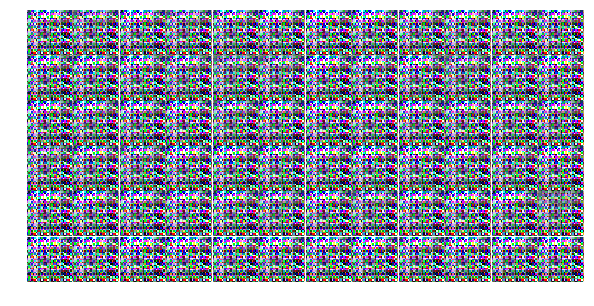

In [31]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))